<a href="https://colab.research.google.com/github/Praveen101010/Praveen101010/blob/main/END_To_END_Dog_Vision_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐶 End-to-End Multi-class Dog Breed classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and Tensorflow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog,
want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data


## 3. Evaluation

The Evaluation is a file with prediction prob for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation


## 4. Features

Some information about the data:
* we're dealing with images(unstructured data) so it's probably best we use deep learning/transfer learning
* There are 120 breeds of dogs(this means there are 120 different classes)
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

In [ ]:
# Unzip the uploaded data into Google
#!unzip "Drive/content/drive/MyDrive/Dog-vision/dog-breed-identification.zip" -d "Drive/content/drive/MyDrive/Dog-vision/"

In [ ]:
!wget https://www.dropbox.com/s/9kjr0ui9qbodfao/dog-breed-identification.zip # download files from Dropbox as zip
import os
import zipfile

local_zip = "dog-breed-identification.zip"
zip_ref = zipfile.ZipFile(local_zip,"r")

zip_ref.extractall('Dog Vision')
zip_ref.close

--2024-07-14 04:41:20--  https://www.dropbox.com/s/9kjr0ui9qbodfao/dog-breed-identification.zip
Resolving www.dropbox.com (www.dropbox.com)... 162.125.5.18, 2620:100:601d:18::a27d:512
Connecting to www.dropbox.com (www.dropbox.com)|162.125.5.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://www.dropbox.com/scl/fi/pjrulzwpa2osmtcl34j5c/dog-breed-identification.zip?rlkey=illavzwa19vysrolwpgqov86a [following]
--2024-07-14 04:41:20--  https://www.dropbox.com/scl/fi/pjrulzwpa2osmtcl34j5c/dog-breed-identification.zip?rlkey=illavzwa19vysrolwpgqov86a
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc11ab807471812f5b087e07b54e.dl.dropboxusercontent.com/cd/0/inline/CWof-7cz4Vr876vNZNOxqBIs9Yzm0Gmqv1cOvpFZTZ5WtCh2Mlrn8gp-KZfFQGVgdmbZzutXjXO9mRa-O6scD7VVjlOJ5XrHvjcZ3LXSjeVwhurgd0Nv9AIcTYZ7ujizgSty_n7P0_inWfUpxLxHJvfv/file# [following]
--2024-07-14 04:41:21--  https://uc11ab807471812f5b08

<bound method ZipFile.close of <zipfile.ZipFile filename='dog-breed-identification.zip' mode='r'>>

In [ ]:
#import tensorflow
import tensorflow as tf
print("TF Version", tf.__version__)

TF Version 2.15.0


### Getting workplace ready

* Import tensorflow
* Import tensorflowhub
* Make sure we're using a GPU

In [ ]:
# import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF versions:", tf.__version__)
print("TF Hub version:", hub.__version__)

# check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF versions: 2.15.0
TF Hub version: 0.16.1
GPU not available


## Getting our data ready (turning into tensors)

with all ML models, out data has to be in numerical format. So that's what we'll be doding first. Turning our images into Tensors(numerical representations).

Let's start by accessing out data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("Dog Vision/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


<Axes: xlabel='breed'>

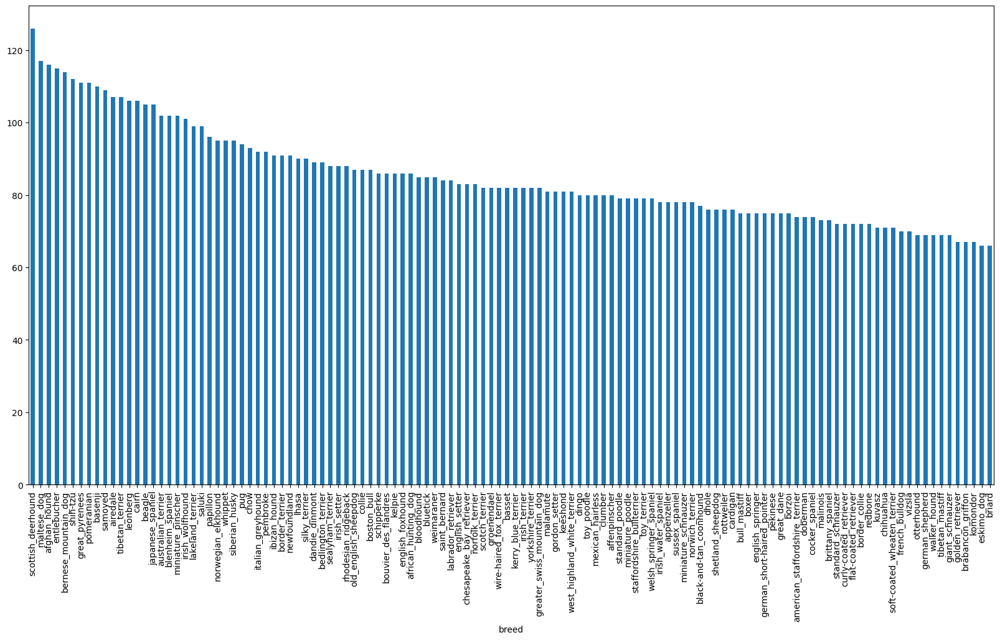

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

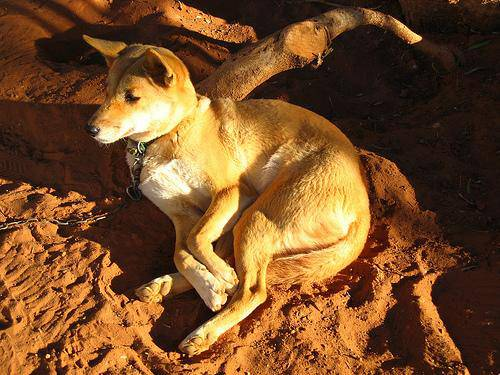

In [ ]:
# Let's view an image
from IPython.display import Image
Image("Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

let's get a list of all our image file pathnames.

In [ ]:
# Create pathnames from inmage ID's
filenames = ["/content/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[9000]

'/content/Dog Vision/train/e20e32bf114141e20a1af854ca4d0ecc.jpg'

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("Dog Vision/train")) == len(filenames):
  print("Filenames match actual amount of files! Proceed")
  print(len(filenames))
  print(len(os.listdir("Dog Vision/train")))
else:
  print("Filenames do not match actual amount of files")


Filenames match actual amount of files! Proceed
10222
10222


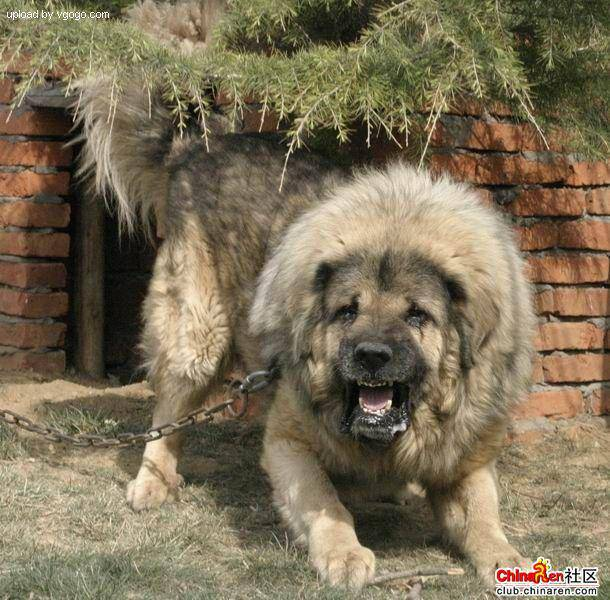

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our trainiing image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames:
if len(labels) == len(filenames):
  print("Number of labels match number of filenames")
else:
  print("Number of labels do not match number of filenames")

Number of labels match number of filenames


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
print(labels[0] == unique_breeds)

boston_bull
[False False False False False False False False False False False False
 False False False False False False False  True False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False]


In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]

In [ ]:
boolean_labels[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0]))  # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there willl be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[1])
print(np.where(unique_breeds == labels[1]))
print(boolean_labels[1].astype(int))

dingo
(array([37]),)
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Creating our own Validation set

Since the datset from kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
# setup X and y variables
X = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# set number of images to use for experimenting
NUM_IMAGES = 1000 # @param {type:"slider", min:1000, max:10000, step:100}


In [ ]:
# let's split our data into train and validation sets
from sklearn.model_selection import train_test_split
X_train, X_valid, y_train, y_valid = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

In [ ]:
len(X_train), len(X_valid), len(y_train), len(y_valid)

(800, 200, 800, 200)

In [ ]:
# Lt's have a geez at the training data
X_train[:2], y_train[:2]

(['/content/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,

## Preprocessing images (turning images into Tensors)

Tp preprocess our images 7into Tensors we're going to write a function which does a few things:
1. Take an image filepat as input
2. Use tensorflow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1).
5. Resize th `image` to be shape of (224, 224)
6. Return the modified `image`

Before we do let's see what impoting an image looks like

In [ ]:
# convert images into numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
print(f"Image shape: {image.shape}")

Image shape: (257, 350, 3)


In [ ]:
# turn image into Tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Now We've seen what an image looks like as a Tensor, let's make a function to preprocess our images.

In [ ]:
IMG_SIZE = 224

# Create a function for preprocessing image
def process_image(image_path):
  """
  Takes an image file path and turn the image into a tensor
  """
  # read in an image file
  image = tf.io.read_file(image_path)
  # turn image into numerical tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224, 3)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

In [ ]:
tensor = tf.io.read_file(filenames[42])

In [ ]:
tensor =   image = tf.image.convert_image_dtype(image, tf.float32)
tensor

<tf.Tensor: shape=(257, 350, 3), dtype=float32, numpy=
array([[[0.34901962, 0.5372549 , 0.34901962],
        [0.29803923, 0.48627454, 0.29803923],
        [0.24705884, 0.43529415, 0.2392157 ],
        ...,
        [0.3019608 , 0.52156866, 0.3372549 ],
        [0.29803923, 0.5254902 , 0.3372549 ],
        [0.29803923, 0.5254902 , 0.3372549 ]],

       [[0.28235295, 0.4666667 , 0.29411766],
        [0.2627451 , 0.44705886, 0.26666668],
        [0.24705884, 0.43137258, 0.2509804 ],
        ...,
        [0.29411766, 0.5137255 , 0.32941177],
        [0.2901961 , 0.5176471 , 0.32941177],
        [0.2901961 , 0.5176471 , 0.32941177]],

       [[0.21960786, 0.40784317, 0.25882354],
        [0.227451  , 0.4156863 , 0.26666668],
        [0.2509804 , 0.43921572, 0.2901961 ],
        ...,
        [0.2784314 , 0.49803925, 0.32156864],
        [0.28627452, 0.5058824 , 0.32941177],
        [0.2901961 , 0.50980395, 0.33333334]],

       ...,

       [[0.00784314, 0.04313726, 0.03921569],
        [0.01

## Turning our data into Batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

SO that's why we do about 32(this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use tensorflow effectively, we need our data in the form of Tendor tuples which look like this: (`image, label`).

In [ ]:
# Create a simple function to return a tupe  (image, label)

def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into yuples of tensors in the form of `(image, label)`, let's turn our data into batches.

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE =32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  shffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # if the data is test dataset, we probably  don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths(no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  # if the data is train dataset
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch= data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data batches...")
    # turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    # shuffle data
    data = data.shuffle(buffer_size=len(X))
    # turn data into batches
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch



In [ ]:
# creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
valid_data = create_data_batches(X_valid, y_valid, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# let's check ouut the different attributes of our data batches
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches

Our data is now in batches, howere these can be little hard to nderstand comprehend, let's visualize them

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
# Function to view images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

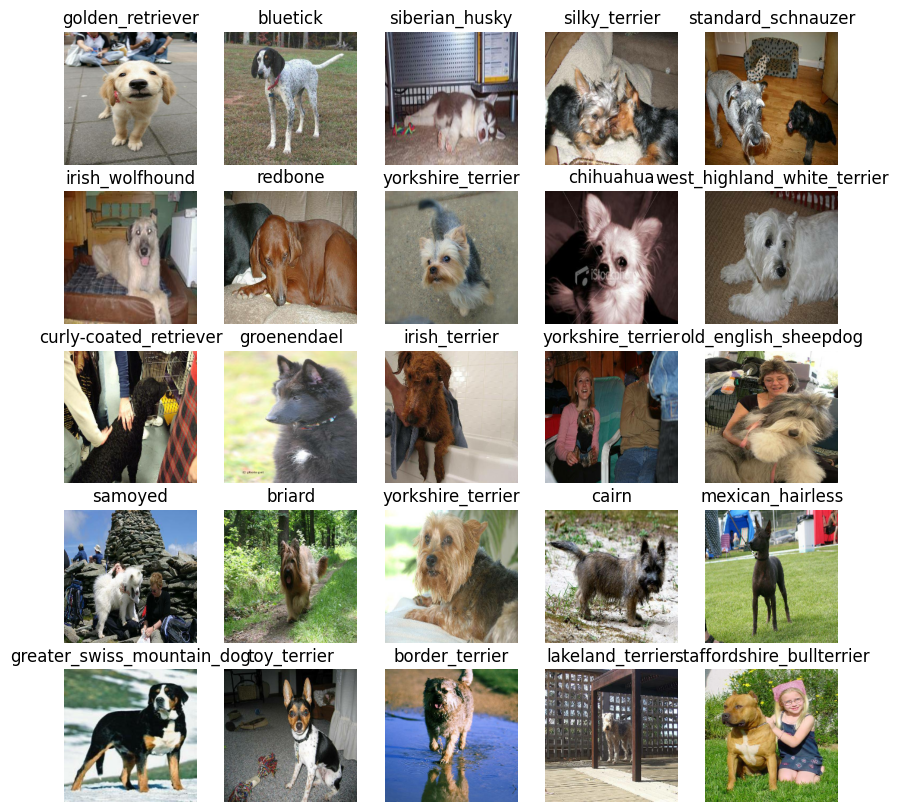

In [ ]:
show_25_images(train_images, train_labels)

In [ ]:
# Now visualize our validation batch
valid_images, valid_labels = next(valid_data.as_numpy_iterator())
len(valid_images), len(valid_labels)

(32, 32)

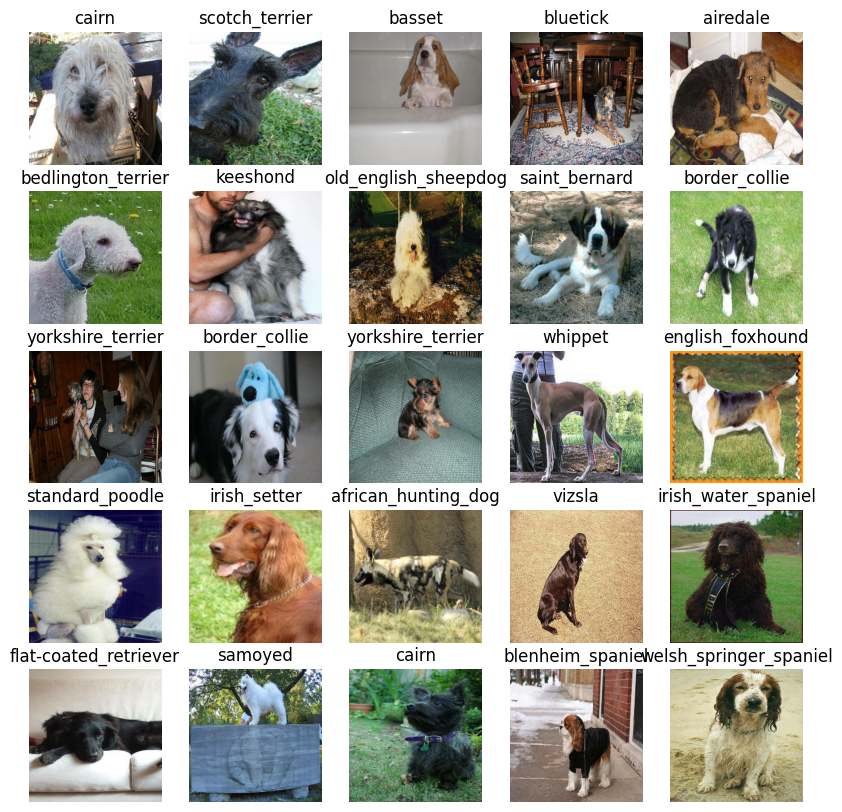

In [ ]:
show_25_images(valid_images,valid_labels)

## Building a model

Before we build a model, there are few things we need to define:
* the input shape (Our image shape, in the form of tensors) to our model,
* The ouput shape (Images labels, in the form of tensors) of our model,
* Th URL of the model we want to use.

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, weight, color channels

# setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# setup model URL from Tensorflow HUB
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"


Now we've got our inputs and outputs and model ready to go, let's put them together into a keras deep learning model!

Knowing this, lt's create a fucntion which:
* Takes the input shape, output shape and the modle we've choosen as parameters
* Defines the layerss in a keras model in sequential fashion (do this first, then this, then that)
* Compiles the model (says it should be evaluated and improved)
* Builds the model (tells the model the input shape it'll be getting)
* Returns the model

In [ ]:
# Create a function which builds a keras model
def create_model(input_shape= INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,activation="softmax") # layer 2 (Output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model(INPUT_SHAPE,OUTPUT_SHAPE,MODEL_URL)

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating Callabacks

Callbacks are helper functions a model can use during training to do such things as savt it's progress, check it's progress or stop training early if a model stops improving.

We'll create two callbacks, one for Tensorboard which helps our models progress and another for early stopping prevents out model from training for too long.

### Tensorboard Callback

To setup a Tensorboard callback, we need to do 3 things:
1. Load the Tensorboard notebook extension
2. Create a Tensorboard callback which is able to save logs to a directory and pass it to our model's `fit()` function
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).

In [ ]:
# Load Tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime
# create a function to build a Tensorboard Callback
def create_tensorboard_callback():
  # Create a log directory for storing
  logdir= os.path.join("/content/Dog Vision/logs",
                       datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping Callback

Early stopping prevents out model from overfitting by stopping training if a certain evaluation metric stops improving.

In [ ]:
# create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                    patience=3)

## Training a model (On subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working

In [ ]:
NUM_EPOCHS = 100 # @param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU: Available" if tf.config.list_physical_devices('GPU') else "not available")

not available


Let's Create a function which trains a model.

1. Create a model using `create_model()`
2. Set up a tensorboard callback using `create_tensorboard_callback()`
3. call the `fit()` function on our model passing it the training dat, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
4. Return the model

In [ ]:
# build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # create a model
  model = create_model()

  # create new tensorboard callback
  tensorboard = create_tensorboard_callback()

  # fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=valid_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 10s 117ms/step - loss: 4.5366 - accuracy: 0.0988 - val_loss: 3.4832 - val_accuracy: 0.2100
Epoch 2/100
25/25 [==============================] - 2s 76ms/step - loss: 1.6194 - accuracy: 0.6850 - val_loss: 2.2230 - val_accuracy: 0.4700
Epoch 3/100
25/25 [==============================] - 3s 107ms/step - loss: 0.5465 - accuracy: 0.9450 - val_loss: 1.7755 - val_accuracy: 0.5350
Epoch 4/100
25/25 [==============================] - 2s 75ms/step - loss: 0.2499 - accuracy: 0.9912 - val_loss: 1.5767 - val_accuracy: 0.5750
Epoch 5/100
25/25 [==============================] - 2s 65ms/step - loss: 0.1445 - accuracy: 0.9987 - val_loss: 1.4926 - val_accuracy: 0.5850
Epoch 6/100
25/25 [==============================] - 2s 75ms/step - loss: 0.0994 - accuracy: 1.0000 - val_loss: 1.4429 - val_accuracy: 0.5950
Epoch 7/100
25/25 [==============================] -

Looks like our model is overfitting, it's performing way better on training dataset than the validation dataset, what are some ways to prevent it?

Note: Overfitting is kinda good thing to begin with

### checking the Tensorboard logs

The Tensorboard magic function(`%tensorboard) will access the logs directory we created earlier and visualize


In [ ]:
%tensorboard --logdir /content/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make preditions on the validation data(not used to train model)

predictions = model.predict(valid_data, verbose=1)
predictions

7/7 [==============================] - 3s 61ms/step


array([[4.54284903e-03, 1.24620623e-04, 1.13147870e-03, ...,
        4.27704981e-05, 1.51252854e-04, 6.14364399e-04],
       [7.11402041e-04, 8.81037049e-05, 2.12294911e-03, ...,
        1.04253326e-04, 3.81463615e-04, 5.17830267e-05],
       [2.69332631e-05, 4.96442153e-05, 2.61436053e-05, ...,
        8.23905575e-05, 5.13744344e-05, 4.29861539e-05],
       ...,
       [2.16774333e-05, 2.56591084e-05, 1.88688264e-05, ...,
        2.38078997e-06, 1.23384729e-04, 1.46428560e-04],
       [1.01036187e-02, 4.87167039e-04, 1.92701627e-04, ...,
        4.34658024e-04, 8.04865413e-05, 9.94499214e-03],
       [4.26384999e-04, 4.79693153e-05, 1.31377601e-03, ...,
        6.55657845e-03, 8.10045982e-04, 2.16849759e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_valid)

200

In [ ]:
len(predictions[0])

120

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# First prediction
print(predictions[0])
print(f"Max value (probablility of prediction): {np.max(predictions[0])}")
print(f"sum: {np.sum(predictions[0])}")
print(f"Max index: {np.argmax(predictions[0])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[0])]}")


[4.54284903e-03 1.24620623e-04 1.13147870e-03 2.29011508e-04
 9.95286391e-05 6.12936992e-06 2.75810361e-02 4.22443787e-04
 1.13502792e-04 4.11368703e-04 6.02711632e-04 4.05070787e-05
 9.61766564e-05 3.73233459e-04 3.24114138e-04 3.72244191e-04
 3.11735239e-05 4.10721675e-02 1.03497856e-04 3.59741462e-05
 2.71883328e-04 3.59774916e-04 2.13916646e-05 2.00258940e-03
 4.35516413e-05 2.25903845e-04 3.40144902e-01 5.67005714e-04
 1.34278811e-03 8.82184017e-04 5.22303308e-05 4.12664609e-04
 3.65849934e-04 2.21387781e-05 1.76727655e-04 1.53380170e-01
 2.34954459e-05 1.13818224e-03 9.05082779e-05 3.58713063e-04
 7.78670947e-04 8.85288955e-06 2.53296876e-05 8.35932733e-05
 2.99781987e-05 3.35512341e-05 3.75213822e-05 2.88091833e-04
 4.63733450e-05 3.05868016e-04 5.37924898e-05 5.24374518e-05
 4.68356666e-05 3.48110880e-05 2.81202065e-05 5.24623374e-06
 2.92586861e-04 8.54556356e-03 3.19270330e-04 7.85047337e-02
 2.35878440e-04 9.84402286e-05 6.27367408e-04 5.81610766e-06
 5.56749059e-04 3.988494

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels

In [ ]:
# Turn prediction probabilities, into their respective labels
def get_pred_label(pred_probs):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(pred_probs)]

# Get a predicted label based on a array of prediction probabilities
pred_label = get_pred_label(predictions[44])
pred_label

NameError: name 'predictions' is not defined

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels(truth labels)

In [ ]:
# create function a unbatch the bathed dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) tensors and returns separate arrays pf images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

In [ ]:
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in valid_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0],labels_[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
val_image, val_label= unbatchify(valid_data)

In [ ]:
val_image[0], val_label[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_label[0])

'affenpinscher'

Now we've got ways to get:
1. Prediction labels
2. Validation labels(truth labels)
3. Validation images

let's make some function to make these all a bit more visualize

we'll create a function which:
* takes an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label
* plot the predicted label, it's predicted proabability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(pred_prob, labels, images, n=1):
  """
  View the prediction, truth label and image for sample n.
  """
  pred_prob, true_label, image=pred_prob[n],labels[n], images[n]

  # get the pred label
  pred_label = get_pred_label(pred_prob)

  # plot the target image
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending in if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}". format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)

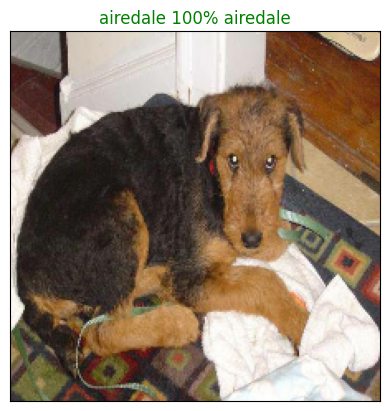

In [ ]:
plot_pred(pred_prob=predictions,
          labels=val_label,
          images=val_image, n=4)

In [ ]:
valid_images[0] == valid_images[1]

array([[[False, False, False],
        [False, False, False],
        [False, False, False],
        ...,
        [False, False, False],
        [False, False, False],
        [False, False, False]],

       [[False, False, False],
        [False, False, False],
        [False, False, False],
        ...,
        [False, False, False],
        [False, False, False],
        [False, False, False]],

       [[False, False, False],
        [False, False, False],
        [False, False, False],
        ...,
        [False, False, False],
        [False, False, False],
        [False, False, False]],

       ...,

       [[False, False, False],
        [False, False, False],
        [False, False, False],
        ...,
        [False, False, False],
        [False, False, False],
        [False, False, False]],

       [[False, False, False],
        [False, False, False],
        [False, False, False],
        ...,
        [False, False, False],
        [False, False, False],
        [False,

Now we've got one function to visualize our models top predictions, let's make another to view our models top 10 predictions:

This function will:
1. Take an input of prediction probabilities array and a ground truth array and an integer
2. Find the prediction using `get_pred_label()`
3. Find the top 10:
  * Prediction probabilities indexes
  * prediction probabilities values
  * Prediction labels
4. Plot the top prediction probability values and labels, coloring the true label green


In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with truth label for sample n
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # get the pred label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # setup plot
  top_plot =plt.bar(np.arange(len(top_10_pred_labels)),
                              top_10_pred_values,
                              color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  # change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass



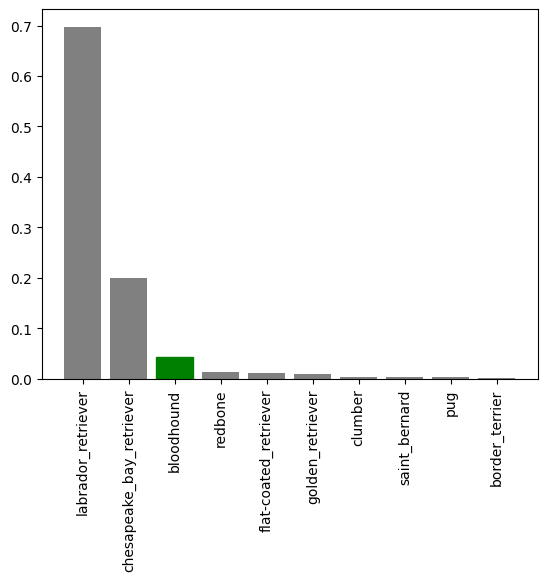

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
              labels=val_label,
              n=100)

Now we've go some function to help us visualize our predictions and evaluate our modle, let's chec out

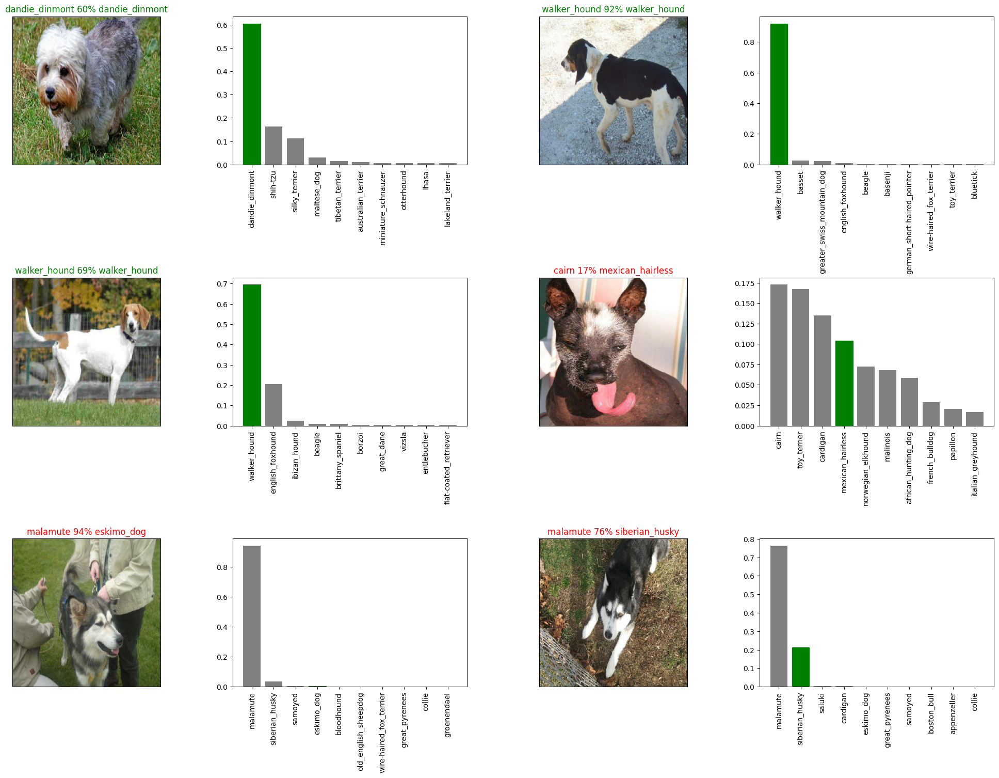

In [ ]:
# let's check out a few predictions and their different values
i_multiplier = 30
num_rows = 3
num_cols = 2

num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(pred_prob=predictions,
            labels=val_label,
            images=val_image,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_label,
                n=i+i_multiplier)
plt.tight_layout(pad=0.5)
plt.show()

**Challenge** How would you create a confusion matrix with our models predictions and true label

## saving and reloading Trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given modle in a models directory and appends a suffix (string).

  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Dog-vision/models",
                         datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" +suffix+ ".h5" # save format of model
  print(f"saving model to:{model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load atrained model:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model=  tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer": hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [ ]:
# save our model trained on 1000 images
save_model(model,suffix="1000-images-")

saving model to:/content/drive/MyDrive/Dog-vision/models/20240714-034337-1000-images-.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Dog-vision/models/20240714-034337-1000-images-.h5'

In [ ]:
loaded_model = load_model("/content/drive/MyDrive/Dog-vision/models/20240714-034337-1000-images-.h5")

Loading saved model from: /content/drive/MyDrive/Dog-vision/models/20240714-034337-1000-images-.h5


In [ ]:
# Evaluate loaded model
model.evaluate(valid_data),
loaded_model.evaluate(valid_data)

7/7 [==============================] - 1s 47ms/step - loss: 1.2808 - accuracy: 0.6550


[1.2808359861373901, 0.6549999713897705]

## Training a Big Dog Model (on the full data)


In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
len(X_train)

800

In [ ]:
# Create a data batch with full data set
full_data = create_data_batches(X,y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model(input_shape=INPUT_SHAPE,
                          output_shape=OUTPUT_SHAPE,
                          model_url=MODEL_URL)

NameError: name 'create_model' is not defined

In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                              patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're runtime has to load all of the images into memory

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
                epochs=NUM_EPOCHS,
                callbacks=[full_model_tensorboard,
                           full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 22s 59ms/step - loss: 1.3251 - accuracy: 0.6735
Epoch 2/100
320/320 [==============================] - 20s 62ms/step - loss: 0.3969 - accuracy: 0.8852
Epoch 3/100
320/320 [==============================] - 18s 56ms/step - loss: 0.2405 - accuracy: 0.9345
Epoch 4/100
320/320 [==============================] - 18s 56ms/step - loss: 0.1534 - accuracy: 0.9651
Epoch 5/100
320/320 [==============================] - 18s 56ms/step - loss: 0.1045 - accuracy: 0.9796
Epoch 6/100
320/320 [==============================] - 20s 61ms/step - loss: 0.0784 - accuracy: 0.9874
Epoch 7/100
320/320 [==============================] - 19s 58ms/step - loss: 0.0581 - accuracy: 0.9920
Epoch 8/100
320/320 [==============================] - 18s 56ms/step - loss: 0.0454 - accuracy: 0.9945
Epoch 9/100
320/320 [==============================] - 18s 57ms/step - loss: 0.0364 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 20s 62ms/step - l

In [ ]:
save_model(full_model, suffix="full-model")

saving model to:/content/drive/MyDrive/Dog-vision/models/20240714-041409-full-model.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Dog-vision/models/20240714-041409-full-model.h5'

In [ ]:
loaded_full_model = load_model("/content/drive/MyDrive/Dog-vision/models/20240714-041409-full-model.h5")

Loading saved model from: /content/drive/MyDrive/Dog-vision/models/20240714-041409-full-model.h5


## Making predictions on the test dataset

Since our model has beeen trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and cconvert them into tensor batches.

To make predictions on the test data, we'll:

* Get the test image filenames.
* Convert the filenames into data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (Since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model

In [ ]:
# Load Test dataset
test_path = "/content/Dog Vision/test/"
test_filenames = [test_path +fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/Dog Vision/test/ea0a254533e645588e739dbdd0e3d3fa.jpg',
 '/content/Dog Vision/test/13310834f9938630a69940a37a8be953.jpg',
 '/content/Dog Vision/test/deaf748bed865ec76758f086db04bfac.jpg',
 '/content/Dog Vision/test/23ebeb57e74030f84613c46d473fa37f.jpg',
 '/content/Dog Vision/test/3b77c6d1ed7ed02317c9854fbd9dbc9e.jpg',
 '/content/Dog Vision/test/4edda78c9a49e0e8a866966275178124.jpg',
 '/content/Dog Vision/test/e9bdf2bcc823964c7375397a7c06242e.jpg',
 '/content/Dog Vision/test/6bc7121268b1278a43802e09a6e42d72.jpg',
 '/content/Dog Vision/test/47ed2ace69bf91c170a1e5a944bc51dc.jpg',
 '/content/Dog Vision/test/494ca45415a021804cbc9810ed640b5f.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 595s 2s/step


In [ ]:
# save pedictions (Numpy array) to csv file (for access later)
np.savetxt("/content/drive/MyDrive/Dog-vision/preds_array/preds_array.csv",test_predictions, delimiter=",")

In [ ]:
# Load predictions (Numpy array)
loaded_preds = np.loadtxt("/content/drive/MyDrive/Dog-vision/preds_array/preds_array.csv", delimiter=",")

In [ ]:
loaded_preds[:10]

array([[2.07545689e-10, 6.53463117e-10, 1.45353882e-10, ...,
        7.88628881e-07, 2.09565416e-12, 1.00982512e-11],
       [1.23945396e-10, 2.20615686e-08, 1.84347981e-10, ...,
        1.22723449e-08, 5.18257037e-09, 4.88772703e-11],
       [2.10327068e-12, 9.99832153e-01, 5.04327957e-09, ...,
        3.14600257e-09, 7.31473770e-11, 2.02645040e-07],
       ...,
       [1.74195669e-09, 3.61026985e-12, 9.94876623e-01, ...,
        9.39481756e-11, 2.93535959e-11, 1.59172092e-10],
       [6.46628529e-10, 2.92182251e-11, 2.03986328e-10, ...,
        3.25152570e-07, 6.98743970e-05, 1.81574344e-09],
       [6.28671976e-11, 4.33152709e-05, 9.03532538e-09, ...,
        2.24453856e-07, 3.53687413e-09, 3.42553648e-07]])

## Preparing test dataset predictions for kaggle

Looking at Kaggle sample submission, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add Data (the prediction probablilities) to each of the dog breed columns.
* Export the DataFrame as a csv to submit to kaggle.

In [ ]:
# Create a pandas DataFramewith empty columns
preds_df = pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# append test images ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids

['ea0a254533e645588e739dbdd0e3d3fa',
 '13310834f9938630a69940a37a8be953',
 'deaf748bed865ec76758f086db04bfac',
 '23ebeb57e74030f84613c46d473fa37f',
 '3b77c6d1ed7ed02317c9854fbd9dbc9e',
 '4edda78c9a49e0e8a866966275178124',
 'e9bdf2bcc823964c7375397a7c06242e',
 '6bc7121268b1278a43802e09a6e42d72',
 '47ed2ace69bf91c170a1e5a944bc51dc',
 '494ca45415a021804cbc9810ed640b5f',
 '138698f34f99fb04361bbcf222235bc6',
 '83970ba9a779f5fc7c05fd1e18a31357',
 '473552792cd0ab8808522efe0b46767b',
 '48d7404637dc82b693e47e22afaf1ddf',
 '9cda2f95e578b99aa002d8ac2110c4fc',
 'dcab2d03a686ab3f31d1bc3e5700f6d1',
 '1b0766eaa16ea5ee3f0d9c287b321eaa',
 '4addecc61b0c8b8edd14fb438d3e6608',
 '200a88dd46fade4426e0ba4c34c6c71d',
 '707d522bc70404c5fcdf524ed2eceb82',
 'accb3c363dcdbf34778c2e6264e5991f',
 '72a41e6590810da581186cdc2b6d3082',
 '16a7e9f6d674462e90c403dd2044f462',
 'ca113721843e1a2729c11dd421891263',
 '1aaf4d6f85e841b44fcaf941efa65811',
 'b730316a295e63cc37b094d0e9e8f20a',
 '68db470841f1ecf43658c30e82fccd30',
 

In [ ]:
preds_df["id"] = test_ids
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ea0a254533e645588e739dbdd0e3d3fa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,13310834f9938630a69940a37a8be953,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,deaf748bed865ec76758f086db04bfac,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,23ebeb57e74030f84613c46d473fa37f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,3b77c6d1ed7ed02317c9854fbd9dbc9e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,436121377cae78c93e1abe991b7fbf82,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10353,768f4beef760032a8808c6a84ac03d77,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10354,6855c3c552ea97f5165adf54c9ca6ca6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10355,3883230e770164d378f4e133a2557dad,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = loaded_preds
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ea0a254533e645588e739dbdd0e3d3fa,2.075457e-10,6.534631e-10,1.453539e-10,7.014842e-08,5.435196e-08,4.796503e-06,2.004703e-14,4.658931e-11,1.148771e-12,...,3.713319e-11,2.103898e-11,1.386718e-09,3.245217e-09,1.801350e-07,8.346237e-15,1.013837e-08,7.886289e-07,2.095654e-12,1.009825e-11
1,13310834f9938630a69940a37a8be953,1.239454e-10,2.206157e-08,1.843480e-10,1.519200e-09,2.917013e-08,1.187855e-08,2.822141e-09,3.158227e-08,9.966469e-01,...,1.291400e-09,1.599797e-09,1.482723e-07,2.071057e-05,9.018115e-09,3.119340e-03,9.717602e-08,1.227234e-08,5.182570e-09,4.887727e-11
2,deaf748bed865ec76758f086db04bfac,2.103271e-12,9.998322e-01,5.043280e-09,1.760412e-08,1.028008e-10,4.876248e-10,2.531586e-08,1.794542e-10,4.731895e-10,...,4.125778e-09,4.129338e-12,1.559897e-08,2.638590e-09,1.095130e-08,4.173440e-09,5.986049e-13,3.146003e-09,7.314738e-11,2.026450e-07
3,23ebeb57e74030f84613c46d473fa37f,4.802421e-12,4.853081e-09,4.627503e-10,3.490527e-09,8.022611e-15,2.451553e-10,5.718674e-10,7.580380e-13,7.803772e-06,...,3.029019e-10,5.758787e-11,1.214587e-08,1.249527e-08,8.810919e-10,2.391933e-13,4.393793e-10,1.698775e-11,4.535751e-09,1.787738e-08
4,3b77c6d1ed7ed02317c9854fbd9dbc9e,2.203090e-12,8.181928e-16,5.816591e-09,5.174989e-14,4.986844e-12,1.583705e-13,4.786637e-11,6.557208e-12,1.705886e-14,...,2.810351e-12,5.933579e-08,7.437003e-14,1.319407e-16,8.816084e-12,5.449448e-15,8.261549e-11,3.334062e-10,9.234340e-14,3.484208e-12


In [ ]:
preds_df.to_csv("/content/drive/MyDrive/Dog-vision/preds_array/full_model_predictions_kaggle.csv",
                index=False)

## Making Predictions in custom images

To make predictions on custom images we'll:
* Get the filepaths of our own images.
* Turn the filspaths into data batches using `create_data_batches()`. And Since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [ ]:
# get custom image filepaths
custom_path = "File path"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

In [ ]:
# Turn custom images into batch datsets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data, verbose=1)
custom_preds

In [ ]:
# get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

In [ ]:
# Get custom images (our unbathify()) function won't work since there aren't labels... maybe we could fix this later.
custom_images =[]
# loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
# check custom image predictions
plt.figire(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.imshow(custom_images[i])
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
plt.tight_layout(pad=0.5)
plt.show